---
title: "Histogram Equalization and Matching"
author: "Devansh Lodha"
date: "2024-12-02"
description: "Exploring histogram matching and equalization between images of Elon Musk, Lenna, a Panda and the IIT Gandhinagar campus!"
categories: [code, probability theory, image processing]
image: "image.png"
jupyter: python3
format: html
---

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [5]:
panda = cv2.imread("grey_1.png",0)
lenna = cv2.imread("grey_2.png",0)
campus = cv2.imread("grey_3.png",0)
elon = cv2.imread("grey_4.png",0)

## Creating the Histogram of an Image

We have a discrete grayscale image $\{x\}$ with $n_i$ as the number of occurences of gray level $i$. The probability of occurence of a pixel of level $i$ in the image is $$p_x(i)=p(x=i)=\frac{n_i}{n}, \qquad 0\leq i < L$$
where $L$ is the total number of grey levels in the image (here $L=256$), $n$ is the total number of pixels in the image (here $n = 512 \times 512$), and $p_x(i)$ is the image's histogram for pixel value $i$ normalized to $[0,1]$

In [6]:
def imgToHist(img):
  hist_data = np.zeros((256))
  # counting number of pixels with a particular value between 0-255
  for x_pixel in range(img.shape[0]):
          for y_pixel in range(img.shape[1]):
              pixel_value = int(img[x_pixel, y_pixel])
              hist_data[pixel_value] += 1

  # normalizing
  hist_data/=(img.shape[0]*img.shape[1])

  # returning the hist
  return hist_data

## Histogram Equalization

We define the cumulative distribution function corresponsing to $i$ as $$\text{cdf}_x(i)=\sum\limits_{j=0}^{i}p_x(x=j)$$ which is also the image's accumulated normalized histogram. \\
We would like to create a transformation of the form $y=T(x)$ to produce a new image $\{y\}$, with a flat histogram. Such as image would have a linearized cumulative distribution function across the value range $$\text{cdf}_y(i)=(i+1)K, \qquad 0 \leq i < L$$
for some constant K.
The properties of the CDF allow us to perform such a transform:
$$y = T(k) = \text{cdf}_x(k)$$
where k is in the range $[0, L-1]$. $T$ maps the levels into $[0,1]$ since we're using normalized histogram of $\{x\}$. In order to map the map the values into their original range, the following transformation needs to be applied:
$$y' = y \cdot (\text{max}\{x\} - \text{min}\{x\}) + \text{min}\{x\} = y \cdot (L-1)$$
$y$ is a real value while $y'$ has to be integer. The mapped value $y'$ should be $0$ for the range of $0 < y \leq \frac{1}{L}$. And $y' = 1$ for $\frac{1}{L}<y\leq \frac{2}{L}$, $y' = 2$ for $\frac{2}{L}<y\leq \frac{3}{L}$, ... $y' = L-1$ for $\frac{L-1}{L}<y\leq 1$. Then the quantization formula for $y$ to $y'$ should be
$$y'=\text{ceil}(L \cdot y)-1$$
($y'=-1$ when $y=0$, however, it does not happen just because $y=0$ means that there is no pixel corresponding to that value.)

In [7]:
def equalize(img):
  hist_data = imgToHist(img)
  cdf_hist = np.cumsum(hist_data) # gives the CDF
  equalized_hist = np.ceil(cdf_hist * 256) - 1 # maps back into original range
  enhancedImg = np.zeros_like(img)
  # now we need to replace initial pixel values with final pixel values
  for x_pixel in range(img.shape[0]):
          for y_pixel in range(img.shape[1]):
              pixel_val = int(img[x_pixel, y_pixel])
              enhancedImg[x_pixel, y_pixel] = equalized_hist[pixel_val]
  return enhancedImg

A function is defined to plot an images and their histograms before and after equalization.
`cmap` is explicity defined to be `gray` since the default color map is `virdis`

In [8]:
def showEqualizedImg(image, enhanced_image):
  source_histogram = imgToHist(image)
  equalized_histogram = imgToHist(enhanced_image)
  fig, axes = plt.subplots(1, 4, figsize=(16, 4))
  # source image
  axes[0].imshow(image, cmap='gray')
  axes[0].set_title('Source Image')
  axes[0].axis('off')
  # source histogram
  axes[1].bar(np.arange(len(source_histogram)), source_histogram, color = "Blue")
  axes[1].set_title('Source Histogram')
  # equalized histogram
  axes[2].bar(np.arange(len(equalized_histogram)), equalized_histogram, color = "Red")
  axes[2].set_title('Equalized Histogram')
  # enhanced image
  axes[3].imshow(enhanced_image, cmap='gray')
  axes[3].set_title('Enhanced Image')
  axes[3].axis('off')

  plt.tight_layout()
  plt.show()

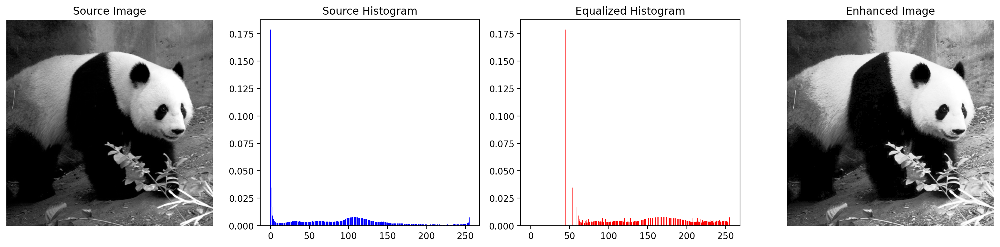

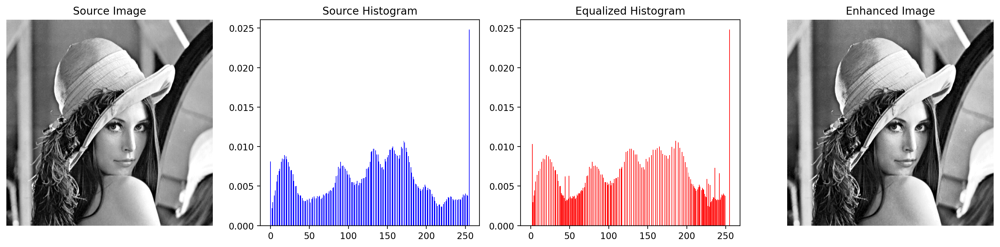

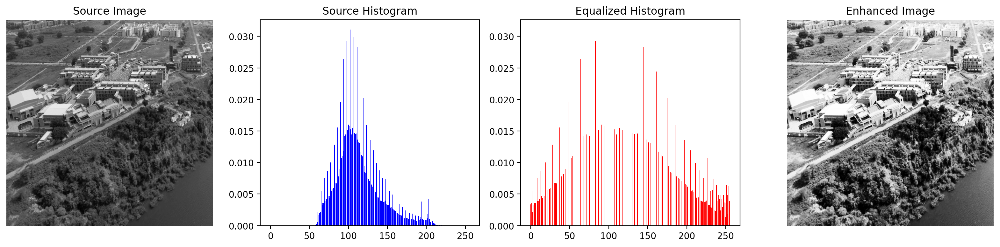

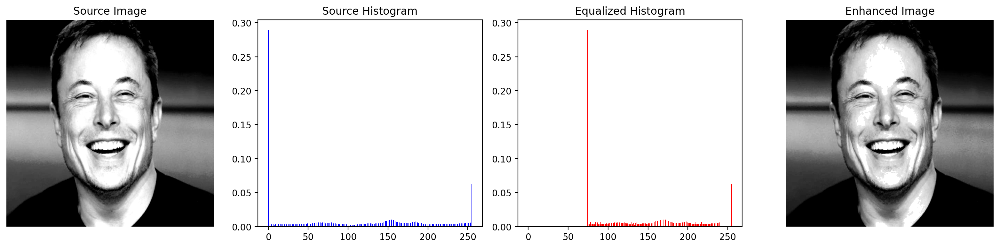

In [9]:
showEqualizedImg(panda, equalize(panda))
showEqualizedImg(lenna, equalize(lenna))
showEqualizedImg(campus, equalize(campus))
showEqualizedImg(elon, equalize(elon))

## Histogram Matching

Consider a grayscale input image $X$. It has a probability density function $p_r(r)$, where $r$ is a grayscale value, and $p_r(r)$ is the probability of that value. This probability can easily be computed from the histogram of the image by $$p_r(r_j)=\frac{n_j}{n}$$
Where $n_j$ is the frequency of the grayscale value $r_j$, and $n$ is the total number of pixels in the image.
Now consider a desired output probability density function $p_z(z)$. A transformation of $p_r(r)$ is needed to convert it to $p_z(z)$. \\
Each pdf (probability density function) can be mapped to its cumulative distribution function by
$$S(r_k)=\sum\limits_{j=0}^{k}p_r(r_j), \qquad k =0,1,2,...,L-1$$
$$G(z_k)=\sum\limits_{j=0}^{k}p_z(z_j), \qquad k =0,1,2,...,L-1$$
Where L is the total number of gray levels (here $L=256$). \\
The idea is to map each $r$ value in $X$ to the $z$ value that has the same probability in the desired pdf: $$S(r_j) = G(z_i) \text{ or } z = G^{-1}(S(r))$$

**Algorithm** \\
Given two images, the reference and the target images, we compute their histograms. Following, we calculate the cumulative distribution functions of the two images' histograms: $F_1$ for for the reference image and $F_2$ for the target image. Then for each gray level $G_1 \in [0, 255]$, we find the gray level $G_2$ for which $F_1(G_1)=F_2(G_2)$ and this is the result of histogram matching function: $M(G_1) = G_2$. Finally, we apply the function $M$ on each pixel of the reference image.

In [10]:
def match(source_image, target_image):
  source_hist = imgToHist(source_image)
  target_hist = imgToHist(target_image)
  cdf_source_hist = np.cumsum(source_hist) # F1
  cdf_target_hist = np.cumsum(target_hist) # F2
  matched = np.zeros_like(source_image)
  for x_pixel in range(source_image.shape[0]):
    for y_pixel in range(source_image.shape[1]):
      pixel_val = source_image[x_pixel, y_pixel] # G1
      index = 255 # assume G2
      # to find G2
      for i in range(256):
        if cdf_target_hist[i] - cdf_source_hist[pixel_val] >= 0:
          index = i
          break
      # applying function on each pixel
      matched[x_pixel, y_pixel] = index
  return matched

A function is defined to source image, target image and image obtained upon matching. \\
`cmap` is explicity defined to be `gray` since the default color map is `virdis`

In [11]:
def showMatchedImg(source_img, target_img, matched_img):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    # source image
    axes[0].imshow(source_img, cmap='gray')
    axes[0].set_title('Source Image')
    axes[0].axis('off')
    # target image
    axes[1].imshow(target_img, cmap='gray')
    axes[1].set_title('Target Image')
    axes[1].axis('off')
    # matched image
    axes[2].imshow(matched_img, cmap='gray')
    axes[2].set_title('Matched Image')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

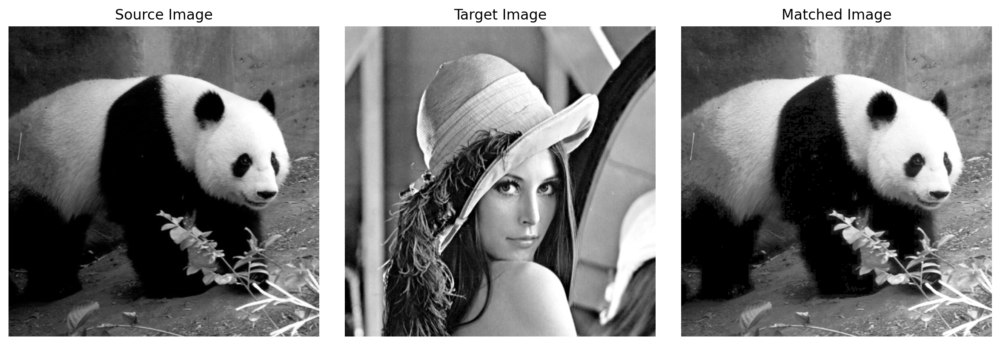

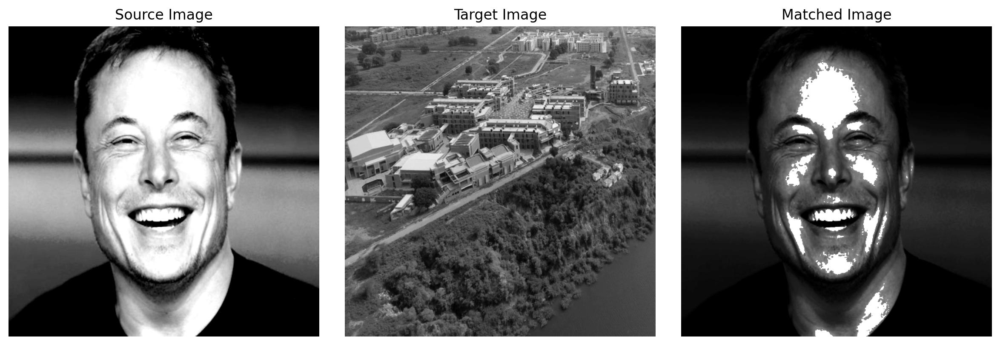

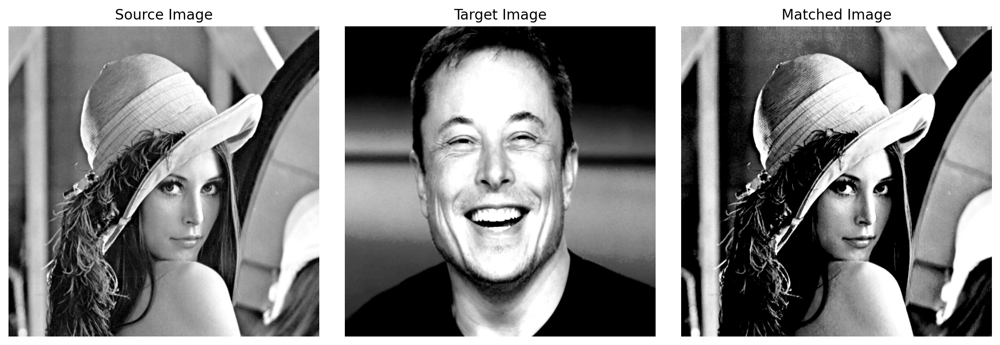

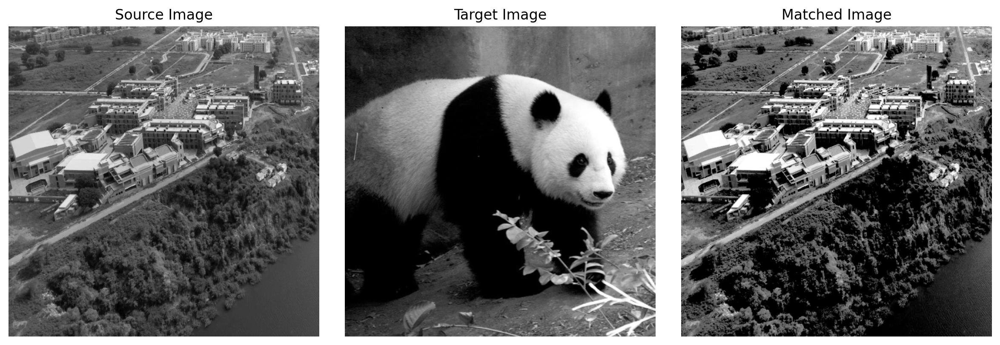

In [12]:
def imageMatch(sourceImage, targetImage):
  matchedImage = match(sourceImage, targetImage)
  showMatchedImg(sourceImage, targetImage, matchedImage)
# according to submission requirements
imageMatch(panda, lenna)
imageMatch(elon, campus)
imageMatch(lenna, elon)
imageMatch(campus, panda)

## References
[1] Wikipedia Contributors, “Histogram equalization,” Wikipedia, May 18, 2018. https://en.wikipedia.org/wiki/Histogram_equalization

[2] “Histogram matching,” Wikipedia, Feb. 07, 2022. https://en.wikipedia.org/wiki/Histogram_matching